# Sentiment Anlaysis of Financial News Headlines of Credit Suisse (January 2022 to March 2023)

## Introduction

Being a financial analyst with over 6 years of experience in the banking industry, I have witnessed the impact of news and headlines on the economy and financial market. With the increasing volume of news and information sources, it has become challenging for investors, supervisors and financial institutions to keep track of the sentiment of news related to the industry.

As an experienced financial analyst, I understand the importance of keeping a pulse on the current banking crisis in the United States. One key tool in our arsenal is sentiment analysis of financial news headlines. By analyzing the sentiment of news headlines related to the banking industry, we can gain valuable insights into the intensity of the crisis and identify potential risks and opportunities. Moreover, it allows us to gain a more nuanced understanding of public sentiment towards the banking industry. By analyzing the sentiment of news headlines related to the industry, we can gauge the level of public trust and confidence in the financial system, identify potential sources of unrest or dissatisfaction, and detect emerging trends and patterns. The importance of sentiment analysis for the banking industry cannot be overstated. The current banking crisis in the United States has far-reaching implications for the financial system and the economy as a whole. As such, it is essential for financial analysts and industry experts to closely monitor the situation and identify any emerging trends or developments that may impact the industry.

To implement the sentiment analysis, we chose to run it on the Credit Suisse Bank for the purpose of this project. This comprehensive report on sentiment analysis of financial news headlines for Credit Suisse will cover the period from January 1, 2022, to March 31, 2023. The objective of this report is to analyze and evaluate the sentiment of financial news headlines related to Credit Suisse, and how it evolved during the period under study. The analysis will also provide insights into how this technique can be further applied to other entities within the banking industry to understand the public's perception of financial institutions and their impact on the banking industry.

## Methodolgy

The sentiment analysis was conducted for three periods: January 2022 to June 2022, July 2022 to December 2022, and January 2023 to March 2023. For each period, financial news articles were collected using EODH APIs which collected 500 articles using ticker CS for Credit Suisse for respective time periods. The scrapped articles were processed using json library and the titles of the articles or headlines were extracted from these articles. Word Clouds were designed for each time period to visually represent the most frequently mentioned words and phrases in the financial news headlines, with the size of each word indicating its frequency in the headlines of 500 articles for their respective periods. Then, for respective periods, the financial news headlines were processed into a data frame to calculate their sentiment scores using compound scores to determine the sentiment of each headline in terms of positive, negative, or neutral. The sentiment scores were visualized via sentiment plots for each period.

The codes used during the analysis are either from the class or written by me. The results, interpretations and explains are provided alongside the codes and visualizations. This notebook will end with the conclusion regarding the whole analysis and will provide the outlook and implications of the analysis.

The code in the first period of analysis will be annotated for each code box, but we will not be annotating it for the other periods because most of the code is repeated. 
We start with importing all the relevant libraries that we will be using throughout the analysis. The VADER is initialized by storing it in a variable that will be used for calculating the sentiment scores for the financial news headlines.

In [2]:
#importing libraries
import spacy
from spacy import displacy
import en_core_web_sm
from collections import Counter
import pandas as pd
pd.options.display.max_rows = 600
pd.options.display.max_colwidth = 400
import glob
from pathlib import Path
import requests
import pprint
from bs4 import BeautifulSoup
from termcolor import colored as cl
from wordcloud import WordCloud
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from PIL import Image
import nltk
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [3]:
# Initialize VADER so we can use it later
sentimentAnalyser = SentimentIntensityAnalyzer()

In [4]:
# api key is appended in the url
api_key = '64442049bf7114.64173604'

## Credit Suise 'CS' Financial News 22H1 2022-01-01 to 2022-06-30

We start by storing the API link in a url variable. The parameters apended in the url are annotated with the code which includes API Key, stock ticker for Credit Suisse 'CS', articles limit is set to 500, from date which is January 1st, 2022, to date which is June 30th, 2022 for this period and lastly, offset is set to 0. The request is generated for the url and it is processed using JSON library.

In [5]:
# parameters (appended in url): 
# stock CS, limit 500, from_date 2022-01-01, to_date 2023-06-30, offset 0
url = f'https://eodhistoricaldata.com/api/news?api_token=64442049bf7114.64173604&s=CS&limit=500&offset=0&from=2022-01-01&to=2022-06-30'

In [6]:
# data request using the defined url
response22H1 = requests.get(url)

In [7]:
# checking the success of the request
response22H1

<Response [200]>

In [8]:
# convert response into JSON format
news22H1 = response22H1.json()

In [9]:
# Pretty Print the JSON formatted response
pprint.pprint(news22H1)

[{'content': 'Chinese President Xi Jinping has said a goal of the common '
             'prosperity plan is to encourage people with high incomes to '
             '"return more to society.”',
  'date': '2022-06-29T12:32:00+00:00',
  'link': 'https://finance.yahoo.com/m/6d74335d-c53f-335d-be4b-f9197f1be8c3/china-cracks-down-on-top-bank.html',
  'sentiment': {'neg': 0, 'neu': 0.875, 'polarity': 0.511, 'pos': 0.125},
  'symbols': ['0267.HK',
              '3908.TSE',
              'CPF.F',
              'CS.US',
              'CSGKF.US',
              'CSGN.SW',
              'CSN.MX',
              'CSX1.F',
              'CTPCF.US',
              'CTPCY.US'],
  'tags': ['CHAMBER OF COMMERCE CHINA',
           'CHINA',
           'CHINA INTERNATIONAL',
           'FINANCIAL INSTITUTIONS',
           'GOLDMAN SACHS GROUP',
           'JAMES ZIMMERMAN',
           'PROSPERITY',
           'SECURITIES REGULATOR'],
  'title': 'China Cracks Down on Top Bank Salaries'},
 {'content': 'Two hire

### Word Cloud

We extract the headlines or titles from the requested articles and they are stored as text string in order to generate word cloud for the assessed period.

In [10]:
# for loop used to extract titles from the articles
for i in range(len(news22H1)):
        title = news22H1[-i]['title']
        print(title)

China Cracks Down on Top Bank Salaries
Credit Suisse Announces Coupon Amount on its Credit Suisse S&amp;P MLP Index ETN (ticker symbol "MLPO")
Credit Suisse Announces Coupon Payments and Expected Coupon Payments on Credit Suisse X-Links® Exchange Traded Notes (the "ETNs")
FQX, Credit Suisse (Schweiz) AG, SFS &amp; Mikron announce the successful completion of a Pilot using eNotes™
Credit Suisse Set to Name David Wah, Jens Welter as Co-Heads of Banking in Promotions
Credit Suisse to outsource procurement services - memo
Big Payday for Ex-Credit Suisse Advisors in Battle Over Deferred Comp
Credit Suisse hires investment banking advisory heads in Britain, France
Netflix Falls as Credit Suisse, MoffettNathanson Sound Subdued
Credit Suisse files five insurance claims on Greensill-linked funds
5 Stocks to Watch That Institutions Are Buying Right Now
Credit Suisse chairman quits over COVID-19 breaches in latest setback
Factbox-Spies, lies and chairman's exit: Credit Suisse's scandals
Five thin

In [11]:
# headlines processed for word cloud
news22H1_combined = ""

for i in news22H1:
    news22H1_combined += i['title'] + " "
print(news22H1_combined[0:2000])

China Cracks Down on Top Bank Salaries Credit Suisse Looks to Channel Goldman Sachs Credit Suisse Eyes Cost Cuts to Stabilize Embattled Bank Credit Suisse ready for ‘big risk opportunities’, says new risk chief Credit Suisse ready for ‘good risk opportunities’, says new risk chief UPDATE 1-Credit Suisse wealth growth initiatives may need to be 'tempered' Credit Suisse to Lean on Wealth Unit, Technology in Revamp UPDATE 1-Credit Suisse sticks to strategic overhaul despite "challenging" environment Credit Suisse sticks to strategic overhaul despite "challenging" environment Credit Suisse Found Guilty in Money-Laundering Case Tied to Cocaine Ring Factbox-Credit Suisse's scandals - spies, lies and money laundering Credit Suisse plans to appeal money-laundering verdict Credit Suisse found guilty in cocaine cash laundering case Credit Suisse found guilty in cocaine cash laundering case Credit Suisse Faces Verdict In Money Laundering Trial: Reuters Credit Suisse faces verdict in cocaine-cash 

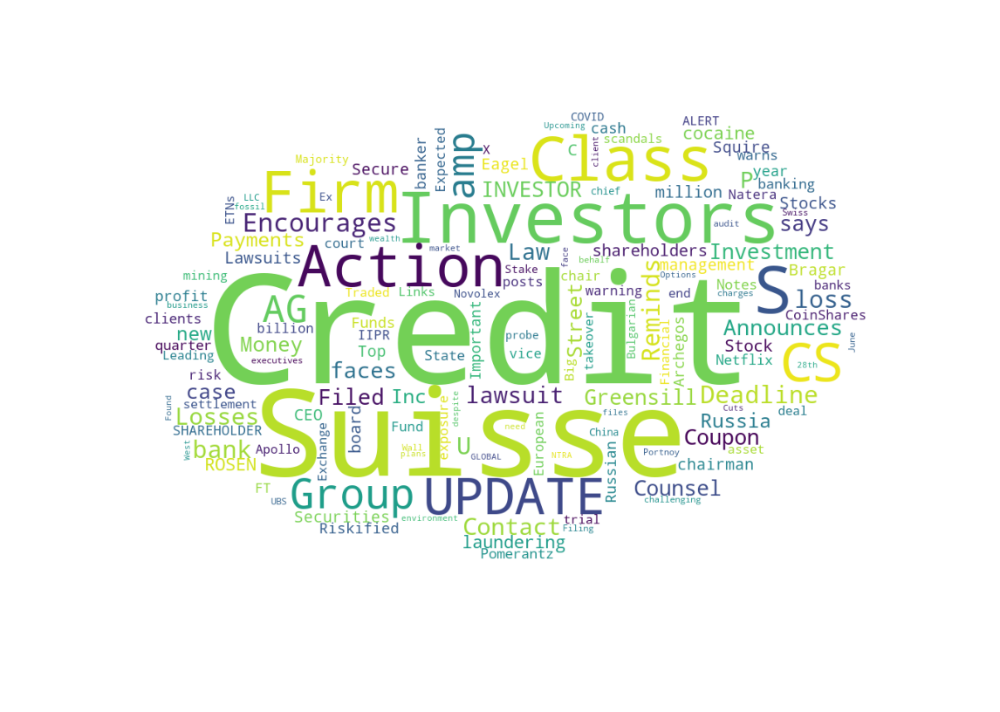

In [12]:
# word cloud generated
mask = np.array(Image.open('cloud2.png'))
wordcloud = WordCloud( 
                width = 2000,
                height = 1334, 
                random_state=1, 
                background_color='white',                 
                max_words = 150,
                mask=mask,
                collocations=False, 
                normalize_plurals=False
                ).generate(news22H1_combined)
plt.figure(figsize=(20,13), dpi=80)
plt.tight_layout(pad=0)
plt.imshow(wordcloud)
plt.axis('off')
plt.box(False)
plt.show()

The word cloud for the First Half of year 2022 revealed that most frequently mentioned words inlcuded "Credit Suisse", "investors", "firm", "class" and "action." Other words that can be noticed are "filed lawsuit", "laundering", "Greensill", "Russia" and "Losses". These other words are smaller in size that means their frequency in the headlines is at lower levels. 

### Sentiment Analysis

In [13]:
# storing headlines in news_22H1 variable
news_22H1 = []
for i in range(len(news22H1)):
        title = news22H1[-i]['title']
        news_22H1.append(title)
        print(title)
        
return news_22H1

China Cracks Down on Top Bank Salaries
Credit Suisse Announces Coupon Amount on its Credit Suisse S&amp;P MLP Index ETN (ticker symbol "MLPO")
Credit Suisse Announces Coupon Payments and Expected Coupon Payments on Credit Suisse X-Links® Exchange Traded Notes (the "ETNs")
FQX, Credit Suisse (Schweiz) AG, SFS &amp; Mikron announce the successful completion of a Pilot using eNotes™
Credit Suisse Set to Name David Wah, Jens Welter as Co-Heads of Banking in Promotions
Credit Suisse to outsource procurement services - memo
Big Payday for Ex-Credit Suisse Advisors in Battle Over Deferred Comp
Credit Suisse hires investment banking advisory heads in Britain, France
Netflix Falls as Credit Suisse, MoffettNathanson Sound Subdued
Credit Suisse files five insurance claims on Greensill-linked funds
5 Stocks to Watch That Institutions Are Buying Right Now
Credit Suisse chairman quits over COVID-19 breaches in latest setback
Factbox-Spies, lies and chairman's exit: Credit Suisse's scandals
Five thin

SyntaxError: 'return' outside function (3783442339.py, line 8)

In [14]:
# sentence numbers for each headline
for number, sentence in enumerate(news_22H1):
    print(number, sentence)

0 China Cracks Down on Top Bank Salaries
1 Credit Suisse Announces Coupon Amount on its Credit Suisse S&amp;P MLP Index ETN (ticker symbol "MLPO")
2 Credit Suisse Announces Coupon Payments and Expected Coupon Payments on Credit Suisse X-Links® Exchange Traded Notes (the "ETNs")
3 FQX, Credit Suisse (Schweiz) AG, SFS &amp; Mikron announce the successful completion of a Pilot using eNotes™
4 Credit Suisse Set to Name David Wah, Jens Welter as Co-Heads of Banking in Promotions
5 Credit Suisse to outsource procurement services - memo
6 Big Payday for Ex-Credit Suisse Advisors in Battle Over Deferred Comp
7 Credit Suisse hires investment banking advisory heads in Britain, France
8 Netflix Falls as Credit Suisse, MoffettNathanson Sound Subdued
9 Credit Suisse files five insurance claims on Greensill-linked funds
10 5 Stocks to Watch That Institutions Are Buying Right Now
11 Credit Suisse chairman quits over COVID-19 breaches in latest setback
12 Factbox-Spies, lies and chairman's exit: Credi

In [15]:
# calculating sentiment score
news_22H1_scores = []
for number, sentence in enumerate(news_22H1):
    scores = sentimentAnalyser.polarity_scores(sentence)
    news_22H1_scores.append({'news_headline': sentence, 'sentence_number': number+1, 'sentiment_score': scores['compound']})

In [16]:
# creating Panda Data Frame
pd.DataFrame(news_22H1_scores)

,news_headline,sentence_number,sentiment_score
0,China Cracks Down on Top Bank Salaries,1,0.2023
1,"Credit Suisse Announces Coupon Amount on its Credit Suisse S&amp;P MLP Index ETN (ticker symbol ""MLPO"")",2,0.6369
2,"Credit Suisse Announces Coupon Payments and Expected Coupon Payments on Credit Suisse X-Links® Exchange Traded Notes (the ""ETNs"")",3,0.6369
3,"FQX, Credit Suisse (Schweiz) AG, SFS &amp; Mikron announce the successful completion of a Pilot using eNotes™",4,0.7506
4,"Credit Suisse Set to Name David Wah, Jens Welter as Co-Heads of Banking in Promotions",5,0.3818
5,Credit Suisse to outsource procurement services - memo,6,0.3818
6,Big Payday for Ex-Credit Suisse Advisors in Battle Over Deferred Comp,7,-0.3818
7,"Credit Suisse hires investment banking advisory heads in Britain, France",8,0.3818
8,"Netflix Falls as Credit Suisse, MoffettNathanson Sound Subdued",9,0.3818
9,Credit Suisse files five insurance claims on Greensill-linked funds,10,0.3818


In [17]:
# storing Panda Data Frame
news_22H1_df = pd.DataFrame(news_22H1_scores)

In [64]:
news_22H1_df.mean()

/var/folders/pt/x90nhjl53xn5lqt95j92sf7w0000gn/T/ipykernel_33763/4240690183.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



sentence_number    176.000000
sentiment_score      0.246040
news_roll            0.244692
dtype: float64

In [18]:
# 10 most negative headlines
news_22H1_df.sort_values(by='sentiment_score')[:10]

,news_headline,sentence_number,sentiment_score
341,"Factbox-Credit Suisse's scandals - spies, lies and money laundering",342,-0.7184
323,Credit Suisse rejects $515 million claim linked to fraudulent adviser,324,-0.5859
212,Expect More Disappointment With Nio Stock,213,-0.5563
94,Credit Suisse leak reveals criminals and dictators among its clients,95,-0.5423
201,Why did Wall Street loan billions to alleged fraudster Bill Hwang?,202,-0.5423
12,"Factbox-Spies, lies and chairman's exit: Credit Suisse's scandals",13,-0.5267
172,Credit Suisse angers investors with five-year ‘hard grind’ on Greensill losses,173,-0.5267
209,U.S. pension fund sues Credit Suisse board over losses in Archegos collapse,210,-0.5106
73,"Credit Suisse Reports $2.2 Billion Loss From Charges, Lower Revenue",74,-0.4588
273,UPDATE 2-Credit Suisse flags second-quarter loss as investment bank drags,274,-0.4588


In [19]:
# 10 most positive headlines
news_22H1_df.sort_values(by='sentiment_score', ascending=False)[:10]

,news_headline,sentence_number,sentiment_score
257,"ROSEN, RESPECTED INVESTOR COUNSEL, Encourages Credit Suisse Group AG Investors to Secure Counsel Before Important Deadline in Securities Class Action – CS",258,0.9291
287,"ROSEN, A TOP RANKED LAW FIRM, Encourages Credit Suisse Group AG Investors to Secure Counsel Before Important Deadline in Securities Class Action – CS",288,0.9087
335,"CS DEADLINE ALERT: ROSEN, GLOBAL INVESTOR COUNSEL, Encourages Credit Suisse Group AG Investors With Losses to Secure Counsel Before Important Tuesday Deadline in Securities Class Action – CS",336,0.8788
311,"ROSEN, LEADING INVESTOR COUNSEL, Encourages Credit Suisse Group AG Investors to Secure Counsel Before Important Deadline in Securities Class Action – CS",312,0.8720
228,"ROSEN, A TOP RANKED FIRM, Encourages Credit Suisse Group AG Investors With Losses Exceeding $100K to Secure Counsel Before Important Deadline in Securities Class Action – CS",229,0.8668
217,"ROSEN, A TOP RANKED LAW FIRM, Encourages Credit Suisse Group AG Investors with Losses Exceeding $100K to Secure Counsel Before Important Deadline in Securities Class Action – CS",218,0.8668
185,Credit Suisse Special Audit Backed by Norway’s Wealth Fund,186,0.8225
184,Norway’s wealth fund backs calls for special audit at scandal-hit Credit Suisse,185,0.8074
249,"CS NOTICE: ROSEN, A LEADING INVESTOR RIGHTS LAW FIRM, Encourages Credit Suisse Group AG Investors with Losses to Secure Counsel Before Important Deadline in Securities Class Action – CS",250,0.8020
324,"ROSEN, GLOBAL INVESTOR COUNSEL, Encourages Credit Suisse Group AG Investors with Losses to Secure Counsel Before Important Deadline in Securities Class Action – CS",325,0.8020


In [20]:
# visualising sentiment scores
fig = px.line(news_22H1_df, x='sentence_number', y="sentiment_score",
             title= "Sentiment Analysis of Credit Suisse News Headlines 2022 H1")
fig.show()

The sentiment plot for first half of 2022 mostly remained positive and the negative spikes touched -0.7 sentiment score at one instance only as the scandals were surfacing during this period and market was still evaluating the impacts of these revelations.

In [21]:
# calculating rolling mean of sentiment scores
news_22H1_df['news_roll'] = news_22H1_df.rolling(5)['sentiment_score'].mean()

In [22]:
# plotting rolling means for generalized view
fig = px.line(news_22H1_df, x='sentence_number', y="news_roll",
             title= "Sentiment Analysis of Credit Suisse News Headlines 2022 H1")
fig.show()

The general view reveal mostly positive sentiment throughout first half of year 2022 as scandals were just surfacing and market was processing the revelations. The rolling mean touched -0.2 at one instance only. Positive sentiment in news headlines throughout the first half reveals that reassurances provided by the Credit Suisse kept market confidence afloat.

## Credit Suise 'CS' News 22H2 2022-07-01 to 2022-12-31

In [23]:
# parameters (appended in url): 
# stock CS, limit 500, from_date 2022-07-01, to_date 2023-12-31, offset 0
url1 = f'https://eodhistoricaldata.com/api/news?api_token=64442049bf7114.64173604&s=CS&limit=500&offset=0&from=2022-07-01&to=2022-12-31'

In [24]:
response22H2 = requests.get(url1)

In [25]:
response22H2

<Response [200]>

In [26]:
news22H2 = response22H2.json()

In [27]:
pprint.pprint(news22H2)

[{'content': 'Few in banking are more so than Credit Suisse shareholders. '
             'Ulrich Körner, in the bank’s top job for just five months, is '
             'implementing a restructuring plan to stave off a client exodus '
             'and inevitable collapse. A few New Year’s resolutions - the '
             'subject of today’s entire Lex column - might signal to the '
             'market that a reversal of fortune is near.\n'
             '\n'
             'Continue reading',
  'date': '2022-12-30T13:00:06+00:00',
  'link': 'https://finance.yahoo.com/m/c022d6b5-c061-332a-a9b5-4936c2af76af/ceo-resolutions%3A-getting.html',
  'sentiment': {'neg': 0.053, 'neu': 0.917, 'polarity': -0.34, 'pos': 0.03},
  'symbols': ['CS.US', 'CSGKF.US', 'CSGN.SW', 'CSN.MX', 'CSX1.F'],
  'tags': ['CREDIT SUISSE',
           'CS FIRST BOSTON',
           'FIRST BOSTON',
           'INEVITABLE COLLAPSE',
           'NEW YEAR’S RESOLUTIONS',
           'SHAREHOLDERS',
           'ULRICH KöRNER'],


### Word Cloud

In [28]:
for i in range(len(news22H2)):
        title = news22H2[-i]['title']
        print(title)

CEO resolutions: getting Credit Suisse’s Körner out of a corner
Credit Suisse Group (CS) Q2 2022 Earnings Call Transcript
Waldencast Closes Merger with Obagi Skincare and Skin Makeup, New Company Starts Trading Thursday
Embattled Credit Suisse's CEO to Resign After $1.7 Billion Loss
‘Uli the Knife’ takes a stab at fixing Credit Suisse
Wall Street cuts price targets for Apple and Amazon ahead of their earnings
Credit Suisse Woes Spread to Singapore With $800 Million Trial
Credit Suisse Outlook Cut  by S&amp;P Global on Management Shuffle, Run of Losses
Credit Suisse shares dive toward record low after credit downgrades
Credit Suisse shares falter on bleak ratings news
A Focus on Victims’ Rights Leads to Investor Payouts in Credit Suisse Case
Credit Suisse Mulls Cutting Thousands of Jobs to Revive Lender
Credit Suisse mulls cutting thousands of jobs globally, report says
Credit Suisse Announces Coupon Payments and Expected Coupon Payments on Credit Suisse X-Links® Exchange Traded Notes (

In [29]:
news22H2_combined = ""

for i in news22H2:
    news22H2_combined += i['title'] + " "
print(news22H2_combined[0:2000])

CEO resolutions: getting Credit Suisse’s Körner out of a corner This offshore energy services company was Europe’s best-performing stock of the year. Credit Suisse was among the worst. Global investment outlook for 2023: Looking for the silver lining Credit Suisse clients are returning, CEO of bank's Swiss business says Correction: Credit Suisse Hertz, General Mills fall premarket;  Steelcase, Lucid Group rise Credit Suisse launches lawsuit against Zurich finance blog Credit Suisse Business Model Endorsed by Switzerland’s Central Bank Swiss central bank sees onus on Credit Suisse to execute revamp ZKB not poaching Credit Suisse clients - CEO in paper UPDATE 1-Credit Suisse, BNP faulted by U.S. bank regulators for resolution plans Credit Suisse, BNP faulted by U.S. bank regulators for resolution plans A Week After Morgan Stanley Layoffs, Goldman Sachs Axes 4,000 Jobs Credit Suisse’s Next Mission: Win Back Customers Apple Is 1 Reason Qualcomm Stock Will Keep Underperforming, Analyst Says

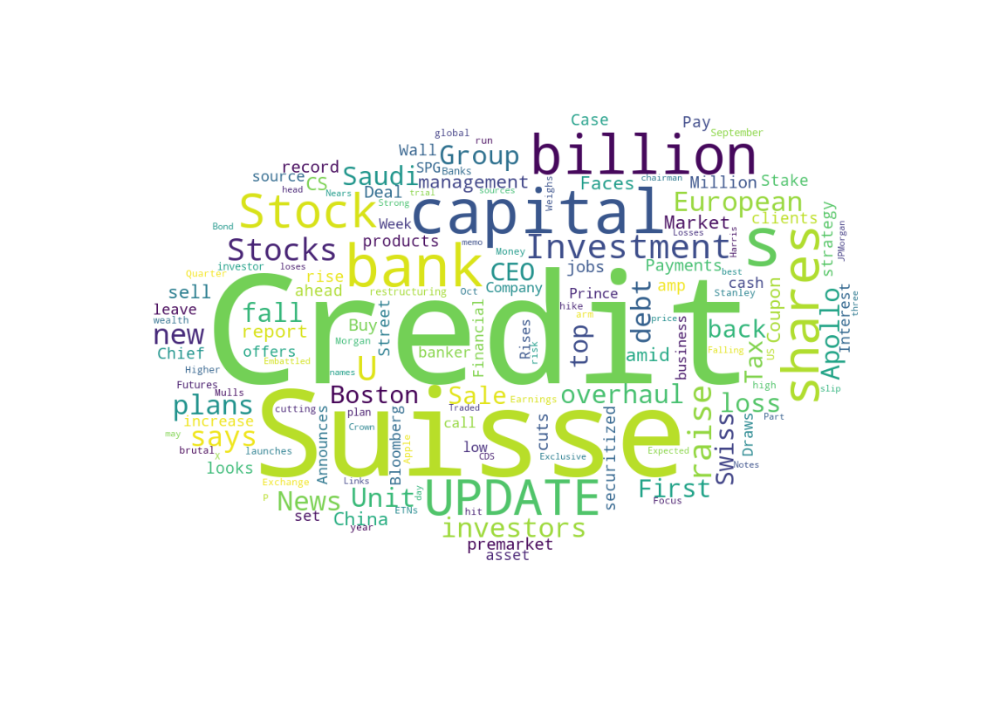

In [30]:
mask = np.array(Image.open('cloud2.png'))
wordcloud = WordCloud( 
                width = 2000,
                height = 1334, 
                random_state=1, 
                background_color='white',                 
                max_words = 150,
                mask=mask,
                collocations=False, 
                normalize_plurals=False
                ).generate(news22H2_combined)
plt.figure(figsize=(20,13), dpi=80)
plt.tight_layout(pad=0)
plt.imshow(wordcloud)
plt.axis('off')
plt.box(False)
plt.show()

The word cloud for the Second Half of year 2022 revealed that most frequently mentioned words inlcuded "Credit Suisse", "stock", "capital", "shares" and "billion." Other words that can be noticed are "investment", "raise", "Swiss", "overhaul" and "Boston". These other words are smaller in size that means their frequency in the headlines is at lower levels. 

### Sentiment Analysis

In [31]:
news_22H2 = []
for i in range(len(news22H2)):
        title = news22H2[-i]['title']
        news_22H2.append(title)
        print(title)
        
return news_22H2

CEO resolutions: getting Credit Suisse’s Körner out of a corner
Credit Suisse Group (CS) Q2 2022 Earnings Call Transcript
Waldencast Closes Merger with Obagi Skincare and Skin Makeup, New Company Starts Trading Thursday
Embattled Credit Suisse's CEO to Resign After $1.7 Billion Loss
‘Uli the Knife’ takes a stab at fixing Credit Suisse
Wall Street cuts price targets for Apple and Amazon ahead of their earnings
Credit Suisse Woes Spread to Singapore With $800 Million Trial
Credit Suisse Outlook Cut  by S&amp;P Global on Management Shuffle, Run of Losses
Credit Suisse shares dive toward record low after credit downgrades
Credit Suisse shares falter on bleak ratings news
A Focus on Victims’ Rights Leads to Investor Payouts in Credit Suisse Case
Credit Suisse Mulls Cutting Thousands of Jobs to Revive Lender
Credit Suisse mulls cutting thousands of jobs globally, report says
Credit Suisse Announces Coupon Payments and Expected Coupon Payments on Credit Suisse X-Links® Exchange Traded Notes (

SyntaxError: 'return' outside function (3632238964.py, line 7)

In [32]:
for number, sentence in enumerate(news_22H2):
    print(number, sentence)

0 CEO resolutions: getting Credit Suisse’s Körner out of a corner
1 Credit Suisse Group (CS) Q2 2022 Earnings Call Transcript
2 Waldencast Closes Merger with Obagi Skincare and Skin Makeup, New Company Starts Trading Thursday
3 Embattled Credit Suisse's CEO to Resign After $1.7 Billion Loss
4 ‘Uli the Knife’ takes a stab at fixing Credit Suisse
5 Wall Street cuts price targets for Apple and Amazon ahead of their earnings
6 Credit Suisse Woes Spread to Singapore With $800 Million Trial
7 Credit Suisse Outlook Cut  by S&amp;P Global on Management Shuffle, Run of Losses
8 Credit Suisse shares dive toward record low after credit downgrades
9 Credit Suisse shares falter on bleak ratings news
10 A Focus on Victims’ Rights Leads to Investor Payouts in Credit Suisse Case
11 Credit Suisse Mulls Cutting Thousands of Jobs to Revive Lender
12 Credit Suisse mulls cutting thousands of jobs globally, report says
13 Credit Suisse Announces Coupon Payments and Expected Coupon Payments on Credit Suisse 

In [33]:
news_22H2_scores = []
for number, sentence in enumerate(news_22H2):
    scores = sentimentAnalyser.polarity_scores(sentence)
    news_22H2_scores.append({'news_headline': sentence, 'sentence_number': number+1, 'sentiment_score': scores['compound']})

In [34]:
pd.DataFrame(news_22H2_scores)

,news_headline,sentence_number,sentiment_score
0,CEO resolutions: getting Credit Suisse’s Körner out of a corner,1,0.3818
1,Credit Suisse Group (CS) Q2 2022 Earnings Call Transcript,2,0.3818
2,"Waldencast Closes Merger with Obagi Skincare and Skin Makeup, New Company Starts Trading Thursday",3,0.0000
3,Embattled Credit Suisse's CEO to Resign After $1.7 Billion Loss,4,-0.2732
4,‘Uli the Knife’ takes a stab at fixing Credit Suisse,5,-0.2960
5,Wall Street cuts price targets for Apple and Amazon ahead of their earnings,6,-0.1280
6,Credit Suisse Woes Spread to Singapore With $800 Million Trial,7,-0.0772
7,"Credit Suisse Outlook Cut by S&amp;P Global on Management Shuffle, Run of Losses",8,-0.2960
8,Credit Suisse shares dive toward record low after credit downgrades,9,0.6486
9,Credit Suisse shares falter on bleak ratings news,10,0.5859


In [35]:
news_22H2_df = pd.DataFrame(news_22H2_scores)

In [65]:
news_22H2_df.mean()

/var/folders/pt/x90nhjl53xn5lqt95j92sf7w0000gn/T/ipykernel_33763/2125947315.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



sentence_number    250.500000
sentiment_score      0.265254
news_roll            0.266130
dtype: float64

In [36]:
# 10 most negative headlines
news_22H2_df.sort_values(by='sentiment_score')[:10]

,news_headline,sentence_number,sentiment_score
423,"Walmart shooting leaves 7 dead, Credit Suisse flags Q4 loss, judge suggests Texas prison for Elizabeth Holmes",424,-0.8074
133,It’s a New Quarter but Old Fears Are Making Markets Nervous,134,-0.7469
155,Credit Suisse Is In Deep Trouble. Contagion Risk Is Low.,156,-0.7430
382,Too Big to Fail? These 2 Major Investment Banks Are Struggling Right Now,383,-0.7430
152,"Factbox-Credit Suisse's scandals - spies, lies and money laundering",153,-0.7184
239,"Here's Why Credit Suisse Is in Trouble, but Not on the Brink of Failure",240,-0.6705
445,Exclusive-Credit Suisse looks to speed up cuts as revenue outlook worsens –sources,446,-0.6486
79,Citrix Debt Deal Prices With Large Losses For Banks,80,-0.6369
145,Dow surges 550 points as stocks attempt to bounce back from brutal September,146,-0.6249
137,U.S. stock futures attempt bounce after brutal September,138,-0.6249


In [37]:
# 10 most positive headlines
news_22H2_df.sort_values(by='sentiment_score', ascending=False)[:10]

,news_headline,sentence_number,sentiment_score
407,"Credit Suisse wealth boss De Ferrari targets growth markets, tech boost",408,0.8779
215,"Russia launches strike against Kyiv, Bernanke and economists win Nobel prize, Credit Suisse rallies",216,0.8481
202,Credit Suisse Echoes Deutsche Bank Move That Won Little Relief,203,0.8445
406,"NEWSMAKER-Credit Suisse wealth boss De Ferrari targets growth markets, tech boost",407,0.8176
127,Credit Suisse reassures investors over its financial strength,128,0.8074
332,Harris Associates welcomes Credit Suisse's approach to improving performance,333,0.7964
335,UPDATE 1-Harris Associates welcomes Credit Suisse's approach to improving performance,336,0.7964
309,"Credit Suisse to sell parts of securitized assets to Apollo-led investor group, raise up to $4.06 billion via new shares",310,0.7845
381,Credit Suisse bankers learn to love their new boss,382,0.7783
451,Credit Suisse shares rise after reports of Saudi Crown Prince interest in IB stake,452,0.7783


In [38]:
fig = px.line(news_22H2_df, x='sentence_number', y="sentiment_score",
             title= "Sentiment Analysis of Credit Suisse News Headlines 2022 H2")
fig.show()

The sentiment plot for second half of 2022 mostly remained positive and but the rise in negative spikes can be observed as they surpassed -0.7 sentiment score on several ocassions and even touched -0.8 sentiment score at one instance. This demonstrates that uncertainity regarding the Credit Suisse outlook began to rise.

In [39]:
news_22H2_df['news_roll'] = news_22H2_df.rolling(5)['sentiment_score'].mean()

In [40]:
fig = px.line(news_22H2_df, x='sentence_number', y="news_roll",
             title= "Sentiment Analysis of Credit Suisse News Headlines 2022 H2")
fig.show()

The general view reveal negative sentiment at the start of second half of 2022 but the year ends slightly positive sentiment. The rolling mean even surpassed -0.3 at one instance. Positive sentiment in news headlines by the year end reveal regain in market confidence as Credit Suisse announced restructuring plans.

## Credit Suise 'CS' News 23Q1 2023-01-01 to 2023-03-31

In [41]:
# parameters (appended in url): 
# stock CS, limit 500, from_date 2023-01-01, to_date 2023-03-31, offset 0
url2 = f'https://eodhistoricaldata.com/api/news?api_token=64442049bf7114.64173604&s=CS&limit=500&offset=0&from=2023-01-01&to=2023-03-31'

In [42]:
response23Q1 = requests.get(url2)

In [43]:
response23Q1

<Response [200]>

In [44]:
news23Q1 = response23Q1.json()

In [45]:
pprint.pprint(news23Q1)

[{'content': 'ZURICH (Reuters) - A poll of Swiss economists found that nearly '
             'half think the takeover of Credit Suisse by UBS was not the best '
             "solution, warning the saga has dented Switzerland's reputation "
             'as a banking centre.\n'
             '\n'
             "Switzerland's KOF economic research institute found that 48% of "
             'the 167 university economists it questioned would have preferred '
             'a state takeover and possible later sale of Credit Suisse.\n'
             '\n'
             '"The advantage of this alternative would have been that it would '
             'not have created a banking giant by Swiss standards and would '
             'have preserved the intensity of competition in the Swiss banking '
             'market," KOF said in a statement on Friday.\n'
             '\n'
             '"At the same time, however, this state solution would probably '
             'have created even higher risks for Sw

### Word Cloud

In [46]:
for i in range(len(news23Q1)):
        title = news23Q1[-i]['title']
        print(title)

Swiss economists question UBS takeover of Credit Suisse in poll
UBS offers to buy Credit Suisse for $1bn in race the save the bank
UBS Offers $1 Billion to Buy Credit Suisse
Braced for Monday: Markets and investors on edge as UBS moves closer to reported $1 billion all-share deal for Credit Suisse.
Braced for Monday. Markets and investors on edge as UBS moves closer to reported $1 billion all-share deal for Credit Suisse.
UBS + CS = ?
Exclusive-Swiss authorities mull imposing losses on Credit Suisse bondholders -sources
UBS offers to buy embattled Credit Suisse for $1 billion: report
UBS/Credit Suisse: shotgun wedding aims to forestall contagion
UBS to Buy Credit Suisse for $1 Billion, Report Says
Credit Suisse Paths Narrow on Low UBS Bid, Government Aid Talks
Riskiest Credit Suisse Bonds Pare Gains on Nationalization Talk
UBS agrees to buy Credit Suisse for more than $2bn
UPDATE 2-UBS agrees to buy Credit Suisse for more than $2 bln - FT
UBS agrees to buy Credit Suisse for more than $

In [47]:
news23Q1_combined = ""

for i in news23Q1:
    news23Q1_combined += i['title'] + " "
print(news23Q1_combined[0:2000])

Swiss economists question UBS takeover of Credit Suisse in poll Markets in Q1: Moving fast and breaking things Analysis-Future for shock-absorbing bank debt uncertain in Credit Suisse aftermath Bank capital: buffers suffer credibility deficit amid liquidity panics Senate Panel Accuses Credit Suisse of Abetting ‘Ongoing’ Tax Evasion. It Might Be UBS’ Problem Soon. Coinbase Says US 1M Tech Jobs At Risk, Microsoft To Place Ads In ChatGPT Powered Bing Search, Netflix Preps For Big Transition Into TV Gaming: Today's Top Stories The $59 Billion Swiss Franc Bond Market Is Up for Grabs Swiss authorities reveal costs of Credit Suisse lifeline RPT-NEWSMAKER-The banker Switzerland trusts to stem Credit Suisse crisis Meet the real boss of UBS FILING DEADLINE--Kuznicki Law PLLC Announces Class Action on Behalf of Shareholders of Credit Suisse Group AG - CS UBS Has to Deal with Another Credit Suisse Scandal Amid Rescue Takeover SHAREHOLDER ALERT: Pomerantz Law Firm Reminds Shareholders with Losses o

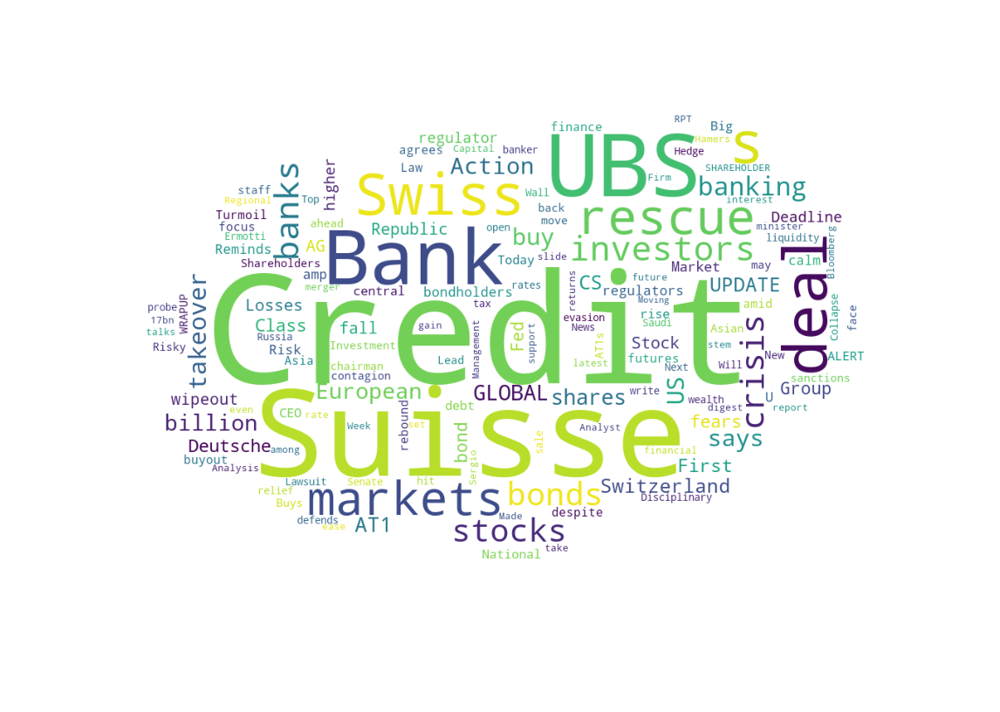

In [48]:
mask = np.array(Image.open('cloud2.png'))
wordcloud = WordCloud( 
                width = 2000,
                height = 1334, 
                random_state=1, 
                background_color='white',                 
                max_words = 150,
                mask=mask,
                collocations=False, 
                normalize_plurals=False
                ).generate(news23Q1_combined)
plt.figure(figsize=(20,13), dpi=80)
plt.tight_layout(pad=0)
plt.imshow(wordcloud)
plt.axis('off')
plt.box(False)
plt.show()

The word cloud for the First Quater of year 2023 revealed that most frequently mentioned words inlcuded "Credit Suisse", "UBS", "Swiss", "deal" and "rescue". Other words that can be noticed are "crisis", "takeover", "investors", "markets" and "Fed support". These other words are smaller in size that means their frequency in the headlines is at lower levels. 

### Sentiment Analysis

In [49]:
news_23Q1 = []
for i in range(len(news23Q1)):
        title = news23Q1[-i]['title']
        news_23Q1.append(title)
        print(title)
        
return news_23Q1

Swiss economists question UBS takeover of Credit Suisse in poll
UBS offers to buy Credit Suisse for $1bn in race the save the bank
UBS Offers $1 Billion to Buy Credit Suisse
Braced for Monday: Markets and investors on edge as UBS moves closer to reported $1 billion all-share deal for Credit Suisse.
Braced for Monday. Markets and investors on edge as UBS moves closer to reported $1 billion all-share deal for Credit Suisse.
UBS + CS = ?
Exclusive-Swiss authorities mull imposing losses on Credit Suisse bondholders -sources
UBS offers to buy embattled Credit Suisse for $1 billion: report
UBS/Credit Suisse: shotgun wedding aims to forestall contagion
UBS to Buy Credit Suisse for $1 Billion, Report Says
Credit Suisse Paths Narrow on Low UBS Bid, Government Aid Talks
Riskiest Credit Suisse Bonds Pare Gains on Nationalization Talk
UBS agrees to buy Credit Suisse for more than $2bn
UPDATE 2-UBS agrees to buy Credit Suisse for more than $2 bln - FT
UBS agrees to buy Credit Suisse for more than $

SyntaxError: 'return' outside function (579963830.py, line 7)

In [50]:
for number, sentence in enumerate(news_23Q1):
    print(number, sentence)

0 Swiss economists question UBS takeover of Credit Suisse in poll
1 UBS offers to buy Credit Suisse for $1bn in race the save the bank
2 UBS Offers $1 Billion to Buy Credit Suisse
3 Braced for Monday: Markets and investors on edge as UBS moves closer to reported $1 billion all-share deal for Credit Suisse.
4 Braced for Monday. Markets and investors on edge as UBS moves closer to reported $1 billion all-share deal for Credit Suisse.
5 UBS + CS = ?
6 Exclusive-Swiss authorities mull imposing losses on Credit Suisse bondholders -sources
7 UBS offers to buy embattled Credit Suisse for $1 billion: report
8 UBS/Credit Suisse: shotgun wedding aims to forestall contagion
9 UBS to Buy Credit Suisse for $1 Billion, Report Says
10 Credit Suisse Paths Narrow on Low UBS Bid, Government Aid Talks
11 Riskiest Credit Suisse Bonds Pare Gains on Nationalization Talk
12 UBS agrees to buy Credit Suisse for more than $2bn
13 UPDATE 2-UBS agrees to buy Credit Suisse for more than $2 bln - FT
14 UBS agrees t

In [51]:
news_23Q1_scores = []
for number, sentence in enumerate(news_23Q1):
    scores = sentimentAnalyser.polarity_scores(sentence)
    news_23Q1_scores.append({'news_headline': sentence, 'sentence_number': number+1, 'sentiment_score': scores['compound']})

In [52]:
pd.DataFrame(news_23Q1_scores)

,news_headline,sentence_number,sentiment_score
0,Swiss economists question UBS takeover of Credit Suisse in poll,1,0.3818
1,UBS offers to buy Credit Suisse for $1bn in race the save the bank,2,0.7003
2,UBS Offers $1 Billion to Buy Credit Suisse,3,0.3818
3,Braced for Monday: Markets and investors on edge as UBS moves closer to reported $1 billion all-share deal for Credit Suisse.,4,0.3818
4,Braced for Monday. Markets and investors on edge as UBS moves closer to reported $1 billion all-share deal for Credit Suisse.,5,0.3818
5,UBS + CS = ?,6,0.0000
6,Exclusive-Swiss authorities mull imposing losses on Credit Suisse bondholders -sources,7,-0.1280
7,UBS offers to buy embattled Credit Suisse for $1 billion: report,8,0.3818
8,UBS/Credit Suisse: shotgun wedding aims to forestall contagion,9,-0.4588
9,"UBS to Buy Credit Suisse for $1 Billion, Report Says",10,0.3818


In [53]:
news_23Q1_df = pd.DataFrame(news_23Q1_scores)

In [66]:
news_23Q1_df.mean()

/var/folders/pt/x90nhjl53xn5lqt95j92sf7w0000gn/T/ipykernel_33763/460141061.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



sentence_number    250.500000
sentiment_score      0.169448
news_roll            0.170046
dtype: float64

In [54]:
# 10 most negative headlines
news_23Q1_df.sort_values(by='sentiment_score')[:10]

,news_headline,sentence_number,sentiment_score
497,Bank capital: buffers suffer credibility deficit amid liquidity panics,498,-0.8442
315,The Fed made a terrible mistake to keep rates so low for so long: Expert,316,-0.8042
100,Shocked Credit Suisse staff fear uncertain future despite UBS rescue deal,101,-0.7784
97,Shocked Credit Suisse staff fear uncertain future despite UBS rescue deal,98,-0.7784
392,How Deutsche Bank caught fire as Europe’s banking crisis spreads,393,-0.7579
136,Credit Suisse’s Death Gives Birth to New Type of Bank Crisis,137,-0.7506
149,"First Republic Stock Slumps On S&amp;P Downgrade, Regional Bank Crisis Pressures",150,-0.7506
388,Deutsche Bank and the Ghost of Crisis Past,389,-0.7506
262,The banking crisis is young yet – brace for a long hot summer of financial accidents,263,-0.7506
65,Asian stocks drop as bank crisis fears offset liquidity support,66,-0.7430


In [55]:
# 10 most positive headlines
news_23Q1_df.sort_values(by='sentiment_score', ascending=False)[:10]

,news_headline,sentence_number,sentiment_score
108,Derivatives that track bonds at the heart of Credit Suisse rescue slide,109,0.8779
113,Derivatives that track bonds at the heart of Credit Suisse rescue slide,114,0.8779
32,ECB ready to help banks even as it hopes for calm after Swiss deal,33,0.8519
208,GLOBAL MARKETS-Bank stocks gain as markets digest Credit Suisse rescue,209,0.8519
88,CREDIT SUISSE GROUP AG (NYSE: CS) SHAREHOLDER CLASS ACTION ALERT: Bernstein Liebhard LLP Reminds Investors of the Deadline to File a Lead Plaintiff Motion in a Securities Class Action Lawsuit Against Credit Suisse Group AG (NYSE: CS),89,0.8468
47,UBS's Credit Suisse deal was the best solution says Swiss gov't,48,0.8442
79,Gold Drops But Other Commodities Muted on Credit Suisse Rescue,80,0.8338
223,"WRAPUP 1-Fed, US banks in focus as mood improves on Credit Suisse rescue",224,0.8271
225,"Fed, US banks in focus as mood improves on Credit Suisse rescue",226,0.8271
148,GLOBAL MARKETS-Scramble for safety subsides as markets digest Credit Suisse rescue,149,0.8271


In [56]:
fig = px.line(news_23Q1_df, x='sentence_number', y="sentiment_score",
             title= "Sentiment Analysis of Credit Suisse News Headlines 2023 Q1")
fig.show()

The sentiment plot for first quater of 2023 witnessed sharp spikes in negative sentiment scores and they even surpassed -0.8 sentiment score levels and the quater ended with the -0.8 sentiment score which is not a good indicator for Credit Suisse outlook for the remaining year of 2023. This demonstrates that market sentiment was mostly negative and market lost the confidence in the Credit Suisse reassurances. Most of the positive sentiment score headlines remained under 0.4 positive score only.

In [57]:
news_23Q1_df['news_roll'] = news_23Q1_df.rolling(5)['sentiment_score'].mean()

In [58]:
fig = px.line(news_23Q1_df, x='sentence_number', y="news_roll",
             title= "Sentiment Analysis of Credit Suisse News Headlines 2023 Q1")
fig.show()

The general view reveal rising negative sentiment in first quater of 2023, comparatively. The rolling mean even touches -0.4 which was not observed earlier and is an indication that Credit Suisse market perception is deteriorating rapidly.

## Analysis

The overall sentiment analysis for the entire period (01-01-2022 to 03-31-2023) shows a declining trend in the market perception and sentiment for Credit Suisse as the mean scores of the sentiments deteriorated from 0.24 to 0.17 by the end of first quarter of 2023. The bank experienced fluctuations in sentiment throughout the three periods, reflecting changes in the financial environment and global events. Several frauds and cases came into highlight, especially Archegos Capital Management and Greensill Capital scandals, which resulted in billions of dollars in losses for the bank. According to a report on the $5.5 billion loss caused by Archegos Capital Management, Credit Suisse ignored or rationalized risks, and non-financial drivers played a key role in weakening the management of risk. Furthermore, there were accusations on Credit Suisse of being involved in managing accounts for human rights abusers, fraudsters, and businessmen who have been placed under sanctions. Furthermore, A major leak of data from Credit Suisse revealed hidden wealth linked to torture, drug trafficking, money laundering, and other serious crimes.

During the first period, the sentiment analysis reveals a neutral to slightly negative sentiment. The mean sentiment score was 0.24 but the most negative news headlines revealed scores -0.72, -0.58 and -0.56 which discussed money laundering, links to criminal clients and fraudulent losses of millions. While the headlines with the most positive scores focused on encouraging the investors to secure counsel before the deadline of securities class action. During this time period, several cases came into the limelight and stock prices started to take the hit. Along with that, the bank faced regulatory scrutiny and fines, which affected investor confidence. However, Credit Suisse was able to navigate these challenges and maintain stable financial results. They changed their leadership and management structure to mitigate the rising negative sentiment. Credit Suisse took proactive measures to address regulatory concerns and improve its risk management practices.

During the same period, investors remained cautious due to the regulatory issues, but some saw potential for long-term growth as the bank implemented changes and worked alongside regulators to address its shortcomings. Regulators closely monitored Credit Suisse's progress in implementing remedial measures and improving compliance which provided slight relief to the investors and public in regaining the confidence in the Credit Suisse.

The second period saw a slight improvement in sentiment as the mean sentiment score improved to 0.27 because Credit Suisse's efforts to address regulatory concerns and improve its operations began to bear fruit, resulting in stronger financial performance and regained investor trust. However, the most negative news headlines revealed scores -0.81, -0.75 and -0.74 which discussed reported loss in fourth quarter of 2022, deep troubles for Credit Suisse and worsen outlook for investment bank and revenue. While the headlines with the most positive scores focused on Credit Suisse reassurance to investors on financial strength of the entity and selling off their securitized assets to raise capital. Credit Suisse continued to invest in growth areas and focused on improving its reputation. The bank's efforts to strengthen risk management and compliance were well-received, contributing to the improved sentiment. The bank also focused on cost-cutting initiatives and strategic investments to strengthen its position in the market. The corrective measures lead to positive sentiment in the financial news headlines.

During the same period, Investors started to regain confidence in Credit Suisse as the bank demonstrated progress in addressing regulatory issues and improving financial performance. The positive sentiment was also driven by the bank's strategic investments and growth initiatives. Regulators observed the bank's progress in implementing changes and acknowledged the improvements in risk management and compliance. They maintained a watchful eye on the bank's activities to ensure continued adherence to regulatory standards.

The sentiment during the third period further deteriorated towards negative side as the mean sentiment score fell to 0.17, reflecting the loss of investors and market confidence in the bank’s remedial measures and promises. The most negative news headlines revealed scores -0.84, -0.80 and -0.78 which discussed capital and liquidity panics in Credit Suisse, uncertainty dooms bank’s employees even after UBS deal and rising of banking crisis as the effects of Credit Suisse failures trickled down to other banks namely, First Republic and Deutsche Bank. While the headlines with the most positive scores focused on stock market regaining points as rescue deal of Credit Suisse is being finalized and US banking industry begins to settle with the news Credit Suisse rescue by UBS. However, Credit Suisse continued to rebuild trust among stakeholders, including investors and clients. This was achieved through improving transparency, accountability and maintaining an open and honest dialogue with stakeholders. Credit Suisse increased transparency by providing regular updates on its operations, financial performance, and risk management practices.

During the same period, investors expressed optimism regarding Credit Suisse's deal with UBS and survival prospects improved with the planned merger. Regulators maintained a positive outlook on Credit Suisse, recognizing the bank's commitment to improving its risk management and compliance practices.

Overall, the sentiment assessed through financial news headlines revealed negative trend in the market sentiment and stakeholder perception regarding the Credit Suisse. This may be a warning sign that the Credit Suisse crisis is intensifying and that the banking industry is facing significant challenges. This information can be used to evaluate the outlook of the company. Investors can use this to strategize their investment decisions and regulators can use this information to mitigate the rising risk levels. Most importantly, this analysis can be applied to other entities in the banking industry to evaluate and predict the banking crisis so that remedial actions can be taken in time to manage the consequences of the crisis.

## Discussions about Word Clouds and Sentiment Analysis

### Word Clouds

Word clouds visually present the most frequent words present in the financial news headlines in this project. Word clouds are good way to compliment the sentiment analysis. They can help identify themes in news headlines, providing a quick and intuitive way to understand the main topics of discussion. By displaying the most frequently mentioned words, word clouds can provide insights into the key terms that are driving the sentiment in financial news headlines. Word clouds offer a visually appealing and easily understandable way to present complex data, making it more accessible and engaging for stakeholders. Word clouds can help analysts quickly identify the most important words and phrases in a large dataset, reducing the time and effort required for manual analysis.

### Sentiment Analysis

Sentiment analysis can be beneficial for the entities themselves, regulators, investors and other stakeholders. It can provide banking entities to monitor the sentiment of financial news headlines in real-time, enabling them to respond quickly to changes in market perception. Investors can monitor the public sentiment regarding the entities while evaluating their investment decision because market sentiment can provide signal regarding the direction of the assessed entity. Moreover, as a data-driven technique, sentiment analysis is relatively cost-effective compared to traditional market research methods, such as surveys or focus groups. Furthermore, sentiment analysis can process large volumes of data from different sources, providing a more comprehensive view of the market sentiment than traditional research methods. Investors, regulators and other stakeholders can use it on whole news articles from various sources to evaluate the market sentiment and perception.

However, there are several limitations that the stakeholders and investors must consider while using the sentiment analysis to assist them in their decision makings. Sentiment analysis relies on the interpretation of subjective data, which can be influenced by various factors, such as cultural differences or personal biases. Financial news headlines can sometimes be ambiguous or contain sarcasm or irony, which can be challenging for sentiment analysis algorithms to accurately interpret. Moreover, sentiment analysis can sometimes struggle to understand the context in which certain words are used, leading to potential misinterpretation of the sentiment.

Therefore, while applying the sentiment analysis for the financial news the stakeholders and investors need to take caution and use different models along with the sentiment analysis to counter the limitations of the sentiment analysis.

## Outlook of Sentiment Analysis for Banking Industry

The sentiment analysis technique employed in this project can be applied to other entities within the banking industry and other industries. By analyzing the sentiment in financial news headlines over time, organizations, investors and other stakeholders can gain valuable insights into market trends, shifts in public perception, and potential opportunities or threats regarding the banking entities. 

Sentiment analysis can help banks understand how their brand is perceived in the market and identify areas that need improvement or reinforcement. Understanding the sentiment of the market can help banks identify potential risks and enable them to implement proactive measures to mitigate them. Regulators and investors can apply the sentiment analysis to identify the weak areas or areas which need improvement. This might be necessary from the regulatory perspective because areas of improvement and risks need to be assessed and determined whether the prevailing issues lie with the individual banking entity or they are systemic issue. Regulators might have to take remedial actions before rising risks in an individual banking entity might become a systemic issue for the whole industry. Similarly, investors can evaluate through sentiment analysis whether a certain sentiment prevails for an individual banking entity or its for the whole industry. Through this they can make precise and informed investment decisions.

Banks and investors can use sentiment analysis to measure the impact of specific events, such as mergers, acquisitions, or regulatory changes, on entity's reputation and market position. Sentiment analysis can help banks and investors identify emerging trends and potential opportunities in the market, allowing them to make informed decisions and strategize accordingly. Analyzing sentiment over time can help predict future trends and potential opportunities or challenges for the bank and the industry. Moreover, specific for the banks themselves, sentiment analysis can provide insights into the performance and perception of competitors, enabling banks to benchmark themselves against their peers and identify areas where they can gain a competitive advantage. Furthermore, the analysis can guide communication strategies and stakeholder engagement efforts to address concerns and maintain trust with public and shareholders. 

## Conclusion

In conclusion, the sentiment analysis of financial news headlines for Credit Suisse from January 1, 2022, to March 31, 2023, revealed a declining trend in sentiments throughout the three periods under study. The accompanying word clouds provided valuable insights into the most frequently mentioned words and phrases in the headlines, helping to identify key trends and topics.

The sentiment analysis technique employed in this report can be applied to other entities within the banking industry, providing valuable insights into industry trends, identifying market perception, and recognizing potential opportunities or threats. However, it is important to consider the limitations of sentiment analysis, such as subjectivity, ambiguity, and context, when interpreting the results. Overall, sentiment analysis of financial news headlines may work as an essential tool for financial analysts and industry experts seeking to gain a better understanding and intensity of the current banking crisis in the United States.

Word clouds offer a visually appealing and easily understandable way to present complex data and can complement sentiment analysis by helping to identify themes, patterns and trends in financial news headlines. By combining sentiment analysis with word cloud visualization, banks, financial institutions, investors, regulators and other stakeholders can gain a deeper understanding of market sentiment and make more informed decisions based on the insights gained. The significance of sentiment analysis in the financial sector highlights its potential as a valuable tool for understanding stakeholder perceptions and navigating the complex landscape of the banking industry.

As an analyst, I hope this report provides valuable insights into the sentiment analysis of financial news headlines for Credit Suisse and its potential applications within the banking industry.